In [67]:

%pylab inline
plt.style.use('dark_background')
pylab.rcParams['figure.figsize'] = (10.0, 6.0)

Populating the interactive namespace from numpy and matplotlib


In [83]:
def quintic_trajectory(p0, pf, v0, vf, ai, af, delta_t):
    t = np.linspace(0, delta_t, 100)  
    a0 = p0
    a1 = v0
    a2 = ai/2
    a3 = (20 * pf - 20 * p0 - (8*vf + 12*v0) * delta_t - (3 * ai - af) * delta_t**2) / (2 * delta_t**3)
    a4 = (30 * p0 - 30 * pf + (14*vf + 16*v0) * delta_t + (3 * ai - 2 * af) * delta_t**2) / (2 * delta_t**4)
    a5 = (12 * pf - 12 * p0 - (6*vf + 6*v0) * delta_t - (ai - af) * delta_t**2) / (2 * delta_t**5)
#     a3 = (-(10 / delta_t**3) * p0 + (10 / delta_t**3) * pf - (6 / delta_t**2) * v0
#          - (4 / delta_t**2) * vf - (3 / 2* (delta_t**2)) * ai + (1 / 2* (delta_t**2)) * af)
        
#     a4 = ((15 / delta_t**4) * p0 - (15 / delta_t**4) * pf + (8 / delta_t**3) * v0
#          + (7 / delta_t**7) * vf + (3 / 2* (delta_t**2)) * ai - (1 / 2* (delta_t**2)) * af)
        
#     a5 = ((-6 / delta_t**5) * p0 + (6 / delta_t**5) * pf - (3 / delta_t**4) * v0 
#          - (3 / delta_t**4) * vf - (1 / 2* (delta_t**3)) * ai + (1 / 2* (delta_t**3)) * af)
        
    polynomial = a0 + a1 * t + a2 * t**2 + a3 * t**3 + a4 * t**4 + a5 * t**5
    derivative = a1 + 2 * a2 * t + 3 * a3 * t**2 + 4 * a4 * t**3 + 5 * a5 * t**4
    second_derivative = 2 * a2 + 6 * a3 * t + 12 * a4 * t**2 + 20 * a5 * t**3
    
    return polynomial, derivative, second_derivative

def cubic_trajectory(x1, x2, v1, v2, delta_t):
  t = np.linspace(0, delta_t, 100)  
  a0 = x1
  a1 = v1
  a2 = (3*x2 - 3*x1 - 2*v1*delta_t - v2 * delta_t) / (delta_t**2)
  a3 = (2*x1 + (v1 + v2) * delta_t  - 2 * x2) / (delta_t**3)

  polynomial = a0 + a1 * t + a2 * t**2 + a3 * t**3
  derivative = a1 + 2*a2 * t + 3 * a3 * t**2
  return polynomial, derivative


def piecewise2D (X,Y, Vx, Vy, Ax, Ay, T):
    theta_x, theta_y, dx, dy, theta2_x, theta2_y, dx2, dy2 = [], [], [], [], [], [], [], []

    for i in range(len(P)-1):          
        theta_xi, dxi = cubic_trajectory(X[i], X[i+1], Vx[i], Vx[i+1], T[i+1] - T[i])
        theta_yi, dyi = cubic_trajectory(Y[i], Y[i+1], Vy[i], Vy[i+1], T[i+1] - T[i])
        
        theta2_xi, dxi2, ddxi2 = quintic_trajectory(X[i], X[i+1], Vx[i], Vx[i+1], Ax[i], Ax[i+1], T[i+1] - T[i])
        theta2_yi, dyi2, ddyi2 = quintic_trajectory(Y[i], Y[i+1], Vy[i], Vy[i+1], Ay[i], Ay[i+1], T[i+1] - T[i])
        
        theta_x += theta_xi.tolist()
        theta_y += theta_yi.tolist()
        dx += dxi.tolist()
        dy += dyi.tolist()
        
        theta2_x += theta2_xi.tolist()
        theta2_y += theta2_yi.tolist()
        dx2 += dxi2.tolist()
        dy2 += dyi2.tolist()
        
        plot(theta_xi, theta_yi)
        plot(theta2_xi, theta2_yi, '--',  linewidth = 2.5)
        
    print(len(P))
    return theta_x, theta_y, dx, dy, theta2_x, theta2_y, dx2, dy2

In [84]:
# Plotting
def plot_points():
    plot(X,Y,)
    plot(X,Y, 'o')
    quiver(X,Y, Vx, Vy, color='r')
    
# Speed
def plot_speed():
    speed = np.sqrt(np.array(dx)**2 + np.array(dy)**2)
    plot(speed)

In [74]:
##### Requirements for the trajectory

# Waypoints
p1 = [0.,0]
p2 = [2,3]
p3 = [4,5]
p4 = [5,-1]
p5 = [1,-1]

# Velocities
# v1 = [0,-0.001]
# v2 = [-1,1]
# v3 = [1,0]
# v4 = [-1,1]
# v5 = [0,-0.001]

v1 = [0,-0.001]
v2 = [1,1]
v3 = [1,0]
v4 = [1,1]
v5 = [0,-0.001]

a1 = [0,0]
a2 = [0,0]
a3 = [0,0]
a4 = [0,0]
a5 = [0,0]

# Time
t1 = 0
t2 = 12
t3 = 22
t4 = 32
t5 = 42

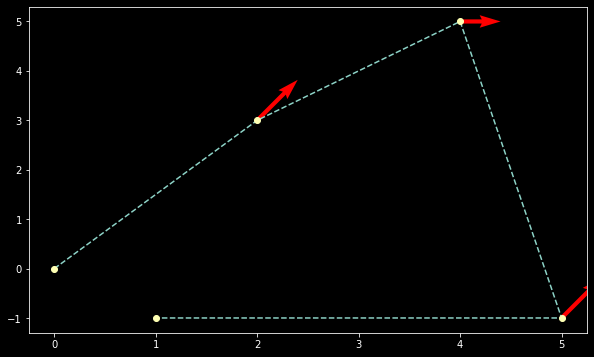

In [75]:
# Convert the initial conditions to a vector form
P = np.vstack((p1, p2, p3, p4, p5))
V = np.vstack((v1, v2, v3, v4, v5))
A = np.vstack((a1, a2, a3, a4, a5))
T = [t1, t2, t3, t4, t5]

X, Y = P[:,0], P[:,1]
Vx, Vy = V[:,0], V[:,1]
Ax, Ay = A[:,0], A[:,1]


    
plot_points()

5


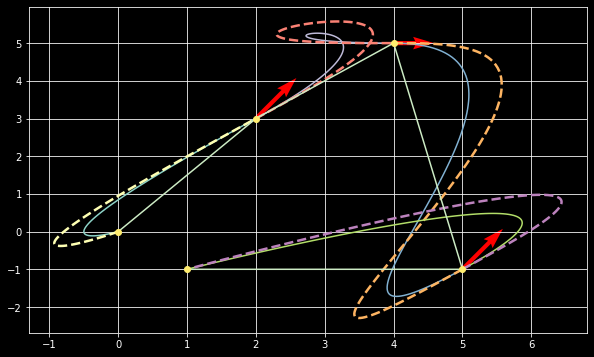

In [85]:

# Plot the trajectory that passes trhough the desired waypoints
theta_x, theta_y, dx, dy, theta2_x, theta2_y, dx2, dy2 = piecewise2D(X,Y, Vx, Vy, Ax, Ay, T)
plot_points()
grid()
# print(theta2_x)

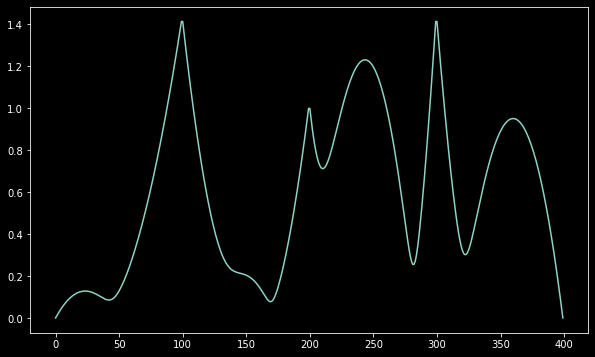

In [37]:
# Plot speed
plot_speed()

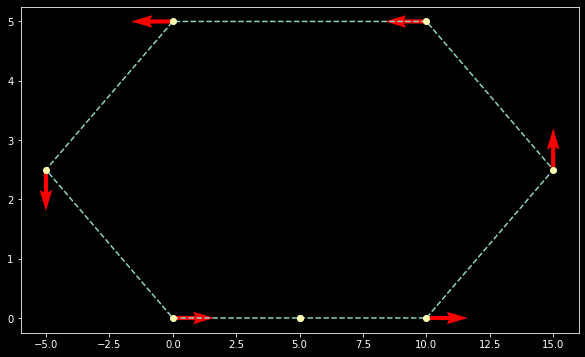

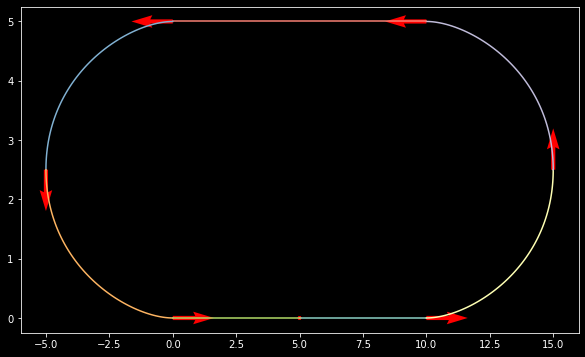

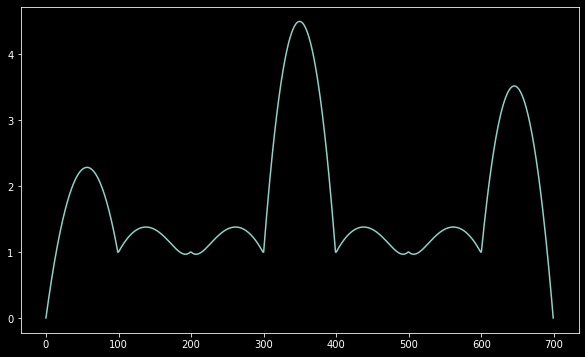

In [8]:
##### Requirements for the trajectory

# Waypoints
p1 = [5.,0]
p2 = [10, 0]
p3 = [15,2.5]
p4 = [10,5]
p5 = [0,5]
p6 = [-5,2.5]
p7 = [0,0]
p8 = [5,0]

# Velocities
v1 = [0.0001,0.]
v2 = [1,0]
v3 = [0,1]
v4 = [-1,0]
v5 = [-1,0]
v6 = [0,-1]
v7 = [1,0]
v8 = [0.0001,0]

# Time
t1 = 0
t2 = t1 + 3
t3 = t2 + 5
t4 = t3 + 5
t5 = t4 + 3
t6 = t5 + 5
t7 = t6 + 5
t8 = t7 + 2


# Grouping
P = np.vstack((p1, p2, p3, p4, p5, p6, p7, p8))
V = np.vstack((v1, v2, v3, v4, v5, v6, v7, v8))
T = [t1, t2, t3, t4, t5, t6, t7, t8]

X, Y = P[:,0], P[:,1]
Vx, Vy = V[:,0], V[:,1]

# Plotting
plot_points()
show()

# Piecewise function
theta_x, theta_y, dx, dy = piecewise2D(X,Y, Vx, Vy, T)

# Plotting
quiver(X,Y, Vx, Vy, color='r')  #

show()
plot_speed()

<ipython-input-87-466d285b4d08>:24: RuntimeWarning: divide by zero encountered in double_scalars
  ax.quiver([theta2_x[t]], [theta2_y[t]], [dx2[t]], [dy2[t]], color='r', units='xy', scale=10/np.linalg.norm([theta2_x[t], theta2_y[t]]))
<ipython-input-87-466d285b4d08>:24: RuntimeWarning: divide by zero encountered in double_scalars
  ax.quiver([theta2_x[t]], [theta2_y[t]], [dx2[t]], [dy2[t]], color='r', units='xy', scale=10/np.linalg.norm([theta2_x[t], theta2_y[t]]))


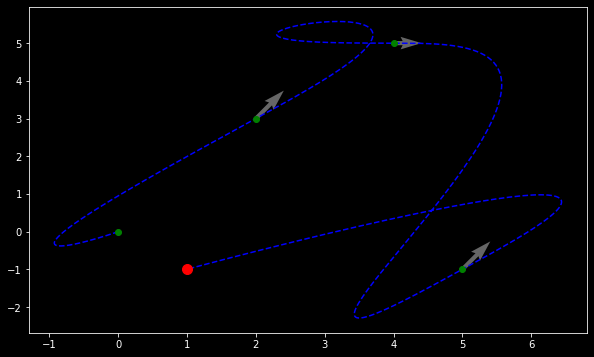

In [87]:

import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(theta2_x, theta2_y, 'b--')
    
    # Initial conditions
    ax.plot(X,Y, 'go')
    ax.quiver(X,Y, Vx, Vy, color='0.4', scale=20)
        
    # Dynamic position
    ax.plot(theta2_x[t], theta2_y[t], 'ro', markersize=10)
       
    # Velocity vector
    ax.quiver([theta2_x[t]], [theta2_y[t]], [dx2[t]], [dy2[t]], color='r', units='xy', scale=10/np.linalg.norm([theta2_x[t], theta2_y[t]]))
    

anim = animation.FuncAnimation(fig, animate, frames=int(len(theta2_x)/1), interval=25)


HTML(anim.to_jshtml())